In [1]:
import warnings
warnings.filterwarnings("ignore")
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.graphics.mosaicplot import mosaic
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from lightgbm import early_stopping

## 데이터 로드

In [6]:
train_df = pd.read_csv('C:/Users/jeonghwanlee/Downloads/train.csv')
test_df = pd.read_csv('C:/Users/jeonghwanlee/Downloads/test.csv')
origin_df = pd.read_csv('C:/Users/jeonghwanlee/Downloads/Churn_Modelling.csv')
train_df.head()

,id,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,0,15674932,Okwudilichukwu,668,France,Male,33.0,3,0.00,2,1.0,0.0,181449.97,0
1,1,15749177,Okwudiliolisa,627,France,Male,33.0,1,0.00,2,1.0,1.0,49503.50,0
2,2,15694510,Hsueh,678,France,Male,40.0,10,0.00,2,1.0,0.0,184866.69,0
3,3,15741417,Kao,581,France,Male,34.0,2,148882.54,1,1.0,1.0,84560.88,0
4,4,15766172,Chiemenam,716,Spain,Male,33.0,5,0.00,2,1.0,1.0,15068.83,0


### 데이터 전처리

In [7]:
train_df = train_df.drop(['id','Surname'], axis=1)
train_df.duplicated().sum()

30

In [11]:
train_df[train_df.duplicated(keep=False)].head(25)

,CustomerId,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
3308,15634281,720,Germany,Female,43.0,10,110822.90,1,0.0,0.0,72861.94,1
5246,15703177,654,France,Female,35.0,2,90865.80,2,1.0,1.0,86764.46,0
6579,15812482,575,France,Male,33.0,3,0.00,2,1.0,0.0,99843.98,0
9158,15678916,512,France,Female,75.0,2,0.00,1,1.0,1.0,123304.62,0
12349,15724838,599,France,Female,43.0,4,0.00,2,1.0,1.0,170347.10,0
13050,15809462,656,France,Male,30.0,3,0.00,2,1.0,1.0,17104.00,0
16253,15698462,532,France,Male,36.0,4,0.00,1,1.0,1.0,132798.78,0
18108,15609987,755,France,Male,42.0,4,119919.12,1,1.0,0.0,156868.21,0
20028,15660429,665,Spain,Female,42.0,2,156371.61,2,1.0,1.0,156774.94,0
24334,15773804,625,France,Male,39.0,5,0.00,2,1.0,0.0,99800.87,0


In [12]:
train_df.drop_duplicates(inplace = True)
train_df.dropna(inplace=True)

In [13]:
train_df = train_df.drop(['CustomerId'], axis = 1)
train_df_encoded = pd.get_dummies(train_df, columns=['Geography','Gender'])
train_df_encoded.head(3)

,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Geography_France,Geography_Germany,Geography_Spain,Gender_Female,Gender_Male
0,668,33.0,3,0.0,2,1.0,0.0,181449.97,0,True,False,False,False,True
1,627,33.0,1,0.0,2,1.0,1.0,49503.50,0,True,False,False,False,True
2,678,40.0,10,0.0,2,1.0,0.0,184866.69,0,True,False,False,False,True


## 데이터 나누기

In [14]:
X = train_df_encoded.drop('Exited', axis = 1)
y = train_df_encoded['Exited']

X_train, X_test, y_train, y_test  = train_test_split(X, y, test_size = 0.2, random_state = 13)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((132003, 13), (33001, 13), (132003,), (33001,))

In [10]:
y_train.value_counts()

Exited
0    104112
1     27891
Name: count, dtype: int64

### 모델 성능 출력 함수

In [15]:
def get_clf_eval(y_test, pred, pred_proba):
    acc = accuracy_score(y_test,pred)
    pre = precision_score(y_test,pred)
    re = recall_score(y_test,pred)
    f1 = f1_score(y_test,pred)
    auc = roc_auc_score(y_test,pred_proba)
    
    confusion = confusion_matrix(y_test, pred)
    
    print("=> confusion matrix")
    print(confusion)
    print('===========')

    print('Accuracy : {0:.4f}, Precision : {1:.4f}'.format(acc,pre))
    print('Recall : {0:.4f}, F1: {1:.4f}, ROC_AUC: {2:.4f}'.format(re, f1, auc))
    return acc, pre, re, f1, auc

In [16]:
def print_clf_eval(y_test, pred, pred_proba):
    confusion = confusion_matrix(y_test, pred)
    acc, pre, re, f1, auc = get_clf_eval(y_test, pred, pred_proba)

    print("=> confusion matrix")
    print(confusion)
    print('===========')

    print('Accuracy : {0:.4f}, Precision : {1:.4f}'.format(acc,pre))
    print('Recall : {0:.4f}, F1: {1:.4f}, ROC_AUC: {2:.4f}'.format(re, f1, auc))

### 모델별 결과 정리 함수

In [17]:
def get_result(model, X_train, y_train, X_test, y_test):
    model.fit(X_train, y_train)
    pred = model.predict(X_test)
    pred_proba = model.predict_proba(X_test)

    return get_clf_eval(y_test, pred, pred_proba[:,1])

In [18]:
def get_result_pd(models, model_names, X_train, y_train, X_test, y_test):
    col_names = ['Accuracy', 'Precision', 'Recall', 'F1', 'AUC']
    tmp =[]

    for model in models:
        tmp.append(get_result(model, X_train, y_train, X_test, y_test))

    return pd.DataFrame(tmp, columns=col_names, index=model_names)

In [19]:
def draw_roc_curve(models, model_names, X_test, y_test):
    plt.figure(figsize=(8,8))

    for model in range(len(models)):
        pred = models[model].predict_proba(X_test)[:, 1]
        fpr, tpr, thresholds = roc_curve(y_test, pred)
        plt.plot(fpr, tpr, label= model_names[model])

    plt.plot([0,1],[0,1], 'k--', label='random guess')
    plt.title('ROC')
    plt.legend()
    plt.grid()
    plt.show()

## Modeling

### class_weight로 불균형 데이터 처리

In [20]:
col_names = ['Accuracy', 'Precision', 'Recall', 'F1', 'ROC_AUC']
model_names = ['LogisticReg', 'DecisionTree', 'RandomForest', 'LightGBM', 'XGBoost']

scale_pos_weight = y_train.value_counts()[0] / y_train.value_counts()[1]

lr = LogisticRegression(class_weight = 'balanced', random_state = 13, solver = 'liblinear')
dt = DecisionTreeClassifier(class_weight = 'balanced', random_state = 13, max_depth = 5)
rf = RandomForestClassifier(class_weight = 'balanced', random_state = 13, max_depth = 5, n_jobs = -1)
lgbm = LGBMClassifier(class_weight = 'balanced', random_state = 13, verbose = 0)
xgb = XGBClassifier(scale_pos_weight = scale_pos_weight, random_state = 13, max_depth = 5)

In [21]:
models = [lr, dt, rf, lgbm, xgb]
result = get_result_pd(models, model_names, X_train, y_train, X_test, y_test)
result 

=> confusion matrix
[[19497  6480]
 [ 1784  5240]]
Accuracy : 0.7496, Precision : 0.4471
Recall : 0.7460, F1: 0.5591, ROC_AUC: 0.8152
=> confusion matrix
[[20807  5170]
 [ 1592  5432]]
Accuracy : 0.7951, Precision : 0.5124
Recall : 0.7733, F1: 0.6164, ROC_AUC: 0.8695
=> confusion matrix
[[20597  5380]
 [ 1487  5537]]
Accuracy : 0.7919, Precision : 0.5072
Recall : 0.7883, F1: 0.6172, ROC_AUC: 0.8732
=> confusion matrix
[[21389  4588]
 [ 1474  5550]]
Accuracy : 0.8163, Precision : 0.5474
Recall : 0.7901, F1: 0.6468, ROC_AUC: 0.8882
=> confusion matrix
[[21364  4613]
 [ 1495  5529]]
Accuracy : 0.8149, Precision : 0.5452
Recall : 0.7872, F1: 0.6442, ROC_AUC: 0.8865


,Accuracy,Precision,Recall,F1,AUC
LogisticReg,0.749583,0.447099,0.746014,0.559112,0.815155
DecisionTree,0.795097,0.512356,0.773349,0.616362,0.869480
RandomForest,0.791915,0.507191,0.788297,0.617245,0.873203
LightGBM,0.816309,0.547445,0.790148,0.646778,0.888204
XGBoost,0.814915,0.545159,0.787158,0.644180,0.886456


- class_weight = 'balanced'로 불균형 데이터를 처리했을 때
    - accuracy : lgbm > xgb > dt
    - recall :  lgbm > rf > xgb
    - roc_auc : lgbm > xgb > rf

In [ ]:
draw_roc_curve(models, model_names, X_test, y_test)

## class_weight로 불균형 처리 GridSearch

### 1. Decision Tree

In [17]:
params = {'max_depth': [3, 5, 7, 10]}

dt = DecisionTreeClassifier(class_weight = 'balanced', random_state = 13, max_depth = 5)

dt_gs = GridSearchCV(estimator=dt, param_grid=params, cv = 5,  scoring='roc_auc')
dt_gs.fit(X_train,y_train)

GridSearchCV(cv=5,
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              max_depth=5, random_state=13),
             param_grid={'max_depth': [3, 5, 7, 10]}, scoring='roc_auc')

In [18]:
dt_gs.best_score_, dt_gs.best_params_

(0.8831439366329269, {'max_depth': 7})

In [19]:
dt_gs = dt_gs.best_estimator_
dt_pred = dt_gs.predict(X_test)
dt_proba = dt_gs.predict_proba(X_test)[:,1]

print_clf_eval(y_test, dt_pred, dt_proba)

=> confusion matrix
[[21512  4465]
 [ 1589  5435]]
Accuracy : 0.8166, Precision : 0.5490
Recall : 0.7738, F1: 0.6423, ROC_AUC: 0.8831


### 2. Logsitic Regression GridSearch

 Logistic Regression 하이퍼 파라미터 종류
- C: 규제 강도를 나타내는 매개변수입니다. 값이 작을수록 규제가 강해지고, 모델이 단순해집니다. 기본값은 1.0입니다.
- penalty: 규제 유형을 지정하는 매개변수입니다. 'l1' 또는 'l2'를 선택할 수 있으며, 기본값은 'l2'입니다. 'l1'은 L1 규제를 나타내며, 'l2'는 L2 규제를 나타냅니다.
   - l1 : 라쏘회귀, 모델의 설명력에 기여하지 못하는 독립변수의 회귀계수를 0으로 만든다. 특성이 제외됨(모델의 단순화)
   - l2 : 릿지회귀, 모델의 설명력에 기여하지 못하는 독립변수의 회귀계수를 가능한 작게 만들어 특성이 출력에 주는 영향을 최소화
- solver: 비용함수의 최솟값을 어떠한 방법으로 찾을 것인지를 지정하는 역할로 최적화에 사용할 알고리즘을 지정하는 매개변수이다.
 다양한 최적화 알고리즘이 있으며, 예를 들어, 'saga', 'liblinear', 'newton-cg' 등이 있습니다.
     - newton-cg : 경사하강법과 마찬가지로 여러 번의 업데이트를 통해서 비용함수를 최소화하는 파라미터의 값을 찾는 방법이다. 하지만 2차 도함수를 계산하는 것이 필요하다는 단점
     - liblinear : 경사하강법은 한 번에 여러개의 파라미터를 업데이트하지만, liblinear은 한 번에 하나의 파라미터만 업데이트한다는 점이 다르다.
     - saga :  경사하강법과 유사하게 작동하지만, 차이점은 이전 업데이트 단계에서의 경사값을 현재 업데이트에 사용한다는 점이다. 이렇게 하면 학습속도가 더 빨라지는 장점이 있다.
- max_iter: 최적화 알고리즘의 최대 반복 횟수를 나타내는 매개변수입니다. 기본값은 100입니다.

In [20]:
params = {'C': [0.01, 0.1, 1, 10, 100],
              'penalty': ['l1', 'l2'],
              'solver': ['saga', 'liblinear', 'lbfgs'],
              'max_iter': [100, 300, 500]}

lr = LogisticRegression(class_weight = 'balanced', random_state = 13, solver = 'liblinear')

lr_gs = GridSearchCV(estimator=lr, param_grid=params, cv = 3, scoring='roc_auc', n_jobs = -1)
lr_gs.fit(X_train,y_train)

GridSearchCV(cv=3,
             estimator=LogisticRegression(class_weight='balanced',
                                          random_state=13, solver='liblinear'),
             n_jobs=-1,
             param_grid={'C': [0.01, 0.1, 1, 10, 100],
                         'max_iter': [100, 300, 500], 'penalty': ['l1', 'l2'],
                         'solver': ['saga', 'liblinear', 'lbfgs']},
             scoring='roc_auc')

In [21]:
lr_gs.best_score_, lr_gs.best_params_

(0.8187015606132144,
 {'C': 10, 'max_iter': 100, 'penalty': 'l1', 'solver': 'liblinear'})

In [22]:
lr_gs = lr_gs.best_estimator_
lr_pred = lr_gs.predict(X_test)
lr_proba = lr_gs.predict_proba(X_test)[:,1]

print_clf_eval(y_test, lr_pred, lr_proba)

=> confusion matrix
[[19691  6286]
 [ 1827  5197]]
Accuracy : 0.7542, Precision : 0.4526
Recall : 0.7399, F1: 0.5616, ROC_AUC: 0.8187


### 3. Random Forest GridSearch

In [23]:
params = {
	'n_estimators':[50, 100, 200],
	'max_depth':[3, 5, 10],
	'min_samples_leaf':[8, 12, 18],
	'min_samples_split':[8, 12, 18]
}

rf = RandomForestClassifier(class_weight = 'balanced', random_state = 13, max_depth = 3, n_jobs = -1)
rf_gs = GridSearchCV(estimator = rf, cv = 3, param_grid = params, n_jobs = -1, scoring='roc_auc')
rf_gs.fit(X_train, y_train)

GridSearchCV(cv=3,
             estimator=RandomForestClassifier(class_weight='balanced',
                                              max_depth=3, n_jobs=-1,
                                              random_state=13),
             n_jobs=-1,
             param_grid={'max_depth': [3, 5, 10],
                         'min_samples_leaf': [8, 12, 18],
                         'min_samples_split': [8, 12, 18],
                         'n_estimators': [50, 100, 200]},
             scoring='roc_auc')

In [24]:
rf_gs.best_score_, rf_gs.best_params_

(0.8858694156601098,
 {'max_depth': 10,
  'min_samples_leaf': 8,
  'min_samples_split': 8,
  'n_estimators': 200})

In [25]:
rf_gs = rf_gs.best_estimator_
rf_pred = rf_gs.predict(X_test)
rf_proba = rf_gs.predict_proba(X_test)[:,1]

print_clf_eval(y_test, rf_pred, rf_proba)

=> confusion matrix
[[21379  4598]
 [ 1513  5511]]
Accuracy : 0.8148, Precision : 0.5452
Recall : 0.7846, F1: 0.6433, ROC_AUC: 0.8851


### 4. LightGBM GridSearch

In [40]:
params = {
    'boosting_type': ['gbdt'],
    'n_estimators': [100, 300, 1000],
    'max_depth' : [3, 5, 7, 10],
    'learning_rate': [0.01, 0.05, 0.1],
    'num_leaves': [31, 63, 127],
    'subsample': [0.8, 0.9, 1.0],
}

lgbm = LGBMClassifier(class_weight = 'balanced', random_state = 13, verbose = 0)

lgbm_gs = GridSearchCV(estimator = lgbm, param_grid = params, cv = 3, scoring='roc_auc')
early_stopping_rounds = 10
eval_set =  [(X_test, y_test)]
lgbm_gs = lgbm_gs.fit(X_train, y_train, eval_set = [(X_test, y_test)], callbacks=[early_stopping(10, verbose=0)])

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

In [42]:
lgbm_gs.best_score_, lgbm_gs.best_params_

(0.889245889666582,
 {'boosting_type': 'gbdt',
  'learning_rate': 0.01,
  'max_depth': 10,
  'n_estimators': 1000,
  'num_leaves': 31,
  'subsample': 0.8})

In [43]:
lgbm_gs = lgbm_gs.best_estimator_
lgbm_pred = lgbm_gs.predict(X_test)
lgbm_pred_proba = lgbm_gs.predict_proba(X_test)[:,1]

print_clf_eval(y_test, lgbm_pred, lgbm_pred_proba)

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
=> confusion matrix
[[21358  4619]
 [ 1463  5561]]
Accuracy : 0.8157, Precision : 0.5463
Recall : 0.7917, F1: 0.6465, ROC_AUC: 0.8884


### 5. XGBoost GridSearch

In [31]:
params = {
    'n_estimators': [100, 300, 1000],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 5, 10],
    'subsample': [0.8]
}

xgb = XGBClassifier(scale_pos_weight = scale_pos_weight, random_state = 13, max_depth = 3, verbose = 0)

xgb_gs = GridSearchCV(estimator = xgb, param_grid = params, cv = 3, verbose = 0, n_jobs = -1, scoring='roc_auc')
xgb_gs.fit(X_train, y_train)

GridSearchCV(cv=3,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=3,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=13, ...),
             n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.05, 0.1],
                         'max_depth': [3, 5, 10],
                         'n_estimators': [100, 300, 1000], 'subsample': [0.8]},
             scoring='roc_auc')

In [32]:
xgb_gs.best_score_, xgb_gs.best_params_

(0.8895357217962986,
 {'learning_rate': 0.01,
  'max_depth': 5,
  'n_estimators': 1000,
  'subsample': 0.8})

In [33]:
xgb_gs = xgb_gs.best_estimator_
xgb_pred = xgb_gs.predict(X_test)
xgb_pred_proba = xgb_gs.predict_proba(X_test)[:,1]

print_clf_eval(y_test, xgb_pred, xgb_pred_proba)

=> confusion matrix
[[21286  4691]
 [ 1435  5589]]
Accuracy : 0.8144, Precision : 0.5437
Recall : 0.7957, F1: 0.6460, ROC_AUC: 0.8886


### 모델별 성능 정리

In [44]:
tmp = []
col_names = ['Accuracy', 'Precision', 'Recall', 'F1', 'ROC_AUC']
model_names = ['LogisticReg', 'DecisionTree', 'RandomForest', 'LightGBM', 'XGBoost']

tmp.append(get_clf_eval(y_test, lr_pred, lr_proba))
tmp.append(get_clf_eval(y_test, dt_pred, dt_proba))
tmp.append(get_clf_eval(y_test, rf_pred, rf_proba))
tmp.append(get_clf_eval(y_test, lgbm_pred, lgbm_pred_proba))
tmp.append(get_clf_eval(y_test, xgb_pred, xgb_pred_proba))

result = pd.DataFrame(tmp, columns=col_names, index=model_names)
result

,Accuracy,Precision,Recall,F1,ROC_AUC
LogisticReg,0.754159,0.452582,0.739892,0.561625,0.818693
DecisionTree,0.816551,0.548990,0.773776,0.642283,0.883142
RandomForest,0.814824,0.545158,0.784596,0.643320,0.885082
LightGBM,0.815703,0.546267,0.791714,0.646478,0.888351
XGBoost,0.814369,0.543677,0.795700,0.645978,0.888560


<div>
<style scoped>
    .dataframe tbody tr th:only-of-type {
        vertical-align: middle;
    }

    .dataframe tbody tr th {
        vertical-align: top;
    }

    .dataframe thead th {
        text-align: right;
    }
</style>
<table border="1" class="dataframe">
  <thead>
    <tr style="text-align: right;">
      <th></th>
      <th>Accuracy</th>
      <th>Precision</th>
      <th>Recall</th>
      <th>F1</th>
      <th>AUC</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <th>LogisticReg</th>
      <td>0.749583</td>
      <td>0.447099</td>
      <td>0.746014</td>
      <td>0.559112</td>
      <td>0.815155</td>
    </tr>
    <tr>
      <th>DecisionTree</th>
      <td>0.795097</td>
      <td>0.512356</td>
      <td>0.773349</td>
      <td>0.616362</td>
      <td>0.869480</td>
    </tr>
    <tr>
      <th>RandomForest</th>
      <td>0.791915</td>
      <td>0.507191</td>
      <td>0.788297</td>
      <td>0.617245</td>
      <td>0.873203</td>
    </tr>
    <tr>
      <th>LightGBM</th>
      <td>0.816309</td>
      <td>0.547445</td>
      <td>0.790148</td>
      <td>0.646778</td>
      <td>0.888204</td>
    </tr>
    <tr>
      <th>XGBoost</th>
      <td>0.814915</td>
      <td>0.545159</td>
      <td>0.787158</td>
      <td>0.644180</td>
      <td>0.886456</td>
    </tr>
  </tbody>
</table>
</div>

- 하이퍼 파리미터 튜닝 후 
   - 그리드 서치를 진행했을 때 성능이 소폭이지만 조금 올라간 것을 볼 수 있다.
    - accuracy : dt > lgbm > xgb
    - recall :  xgb > lgbm > rf
    - roc_auc : xgb > lgbm > rf

-  최종적으로 모델은 1. xgb, 2. lgbm로 도출되었다.
   -  xgb : {'learning_rate': 0.01,'max_depth': 5, 'n_estimators': 1000}
   - lgbm : {'boosting_type': 'gbdt','learning_rate': 0.01,'max_depth': 10,'n_estimators': 1000,'num_leaves': 31}
   


In [ ]:
models = [lr_gs, dt_gs, rf_gs, lgbm_gs, xgb_gs]
draw_roc_curve(models, model_names, X_test, y_test)

### 모델의 특성 중요도 확인

#### 1. lgbm

In [45]:
def get_feature_importance(lgbm_gs, X_train):
    fi = pd.DataFrame(list(zip(X_train.columns, lgbm_gs)), 
                        columns=['Feature', 'Importance']).sort_values(by='Importance', ascending=False)
    return fi

fi = get_feature_importance(lgbm_gs.feature_importances_, X_train)
fi

,Feature,Importance
1,Age,5417
3,Balance,5287
7,EstimatedSalary,4722
0,CreditScore,4676
4,NumOfProducts,2693
6,IsActiveMember,1708
11,Gender_Female,1504
2,Tenure,1459
9,Geography_Germany,1408
5,HasCrCard,674


#### 2. xgb

In [38]:
fi = get_feature_importance(xgb_gs.feature_importances_, X_train)
fi

,Feature,Importance
4,NumOfProducts,0.402654
1,Age,0.226216
6,IsActiveMember,0.136057
9,Geography_Germany,0.071775
11,Gender_Female,0.060565
3,Balance,0.044408
5,HasCrCard,0.017522
0,CreditScore,0.009273
7,EstimatedSalary,0.008589
2,Tenure,0.008119


 - 모델별 특성 중요도
    - lgbm : 나이, 잔고, 예상급여, 신용점수, 가입 상품 수
    - xgboost : 가입 상품 수, 나이, 활성멤버, 거주지역(독일), 잔고
 - -> 나이, 가입 상품 수, 잔고가 주요 특성으로 확인

## 이상치 확인

In [23]:
def outlier_detector(df, cols, take_care_outliners=False, print_outliners=False, q_1=0.25, q_3=0.75):
    '''
    Detect outliers in the dataframe by trimming method
    Args:
        df: dataframe
        cols: list of columns to detect outliers
        take_care_outliners: if True, remove outliers from the dataframe
        print_outliners: if True, print outliners
        q_1: lower quartile
        q_3: upper quartile
    Return:
        temp: dataframe contains outliers information
        data: dataframe after removing outliers
    '''
    temp = pd.DataFrame()
    data_copy = df.copy()
    for col in cols:
        Q1 = data_copy[col].quantile(q_1)
        Q3 = data_copy[col].quantile(q_3)
        IQR = Q3 - Q1
        upper = Q3 + 1.5 * IQR
        lower = Q1 - 1.5 * IQR
        
        temp.loc[col, "Min"] = round(data_copy[col].min())
        temp.loc[col, "Low_Limit"] = round(lower)
        temp.loc[col, "Mean"] = round(data_copy[col].mean())
        temp.loc[col, "Median"] = round(data_copy[col].median())
        temp.loc[col,"Up_Limit"] = round(upper)
        temp.loc[col, "Max"] = data_copy[col].max()        
        temp.loc[col, "Outlier"] = "Min-Max" if (data_copy[col].max() > upper) & (lower > data_copy[col].min())\
                                    else ("Max" if data_copy[col].max() > upper \
                                    else ("Min" if lower > data_copy[col].min() \
                                    else "No"))
        temp.loc[col, 'Number of Outliers'] = data_copy.loc[(data_copy[col] > upper) | (data_copy[col] < lower)].shape[0]
        
        if take_care_outliners:
            # data_copy = data_copy[(data_copy[col] <= upper) & (data_copy[col] >= lower)]
            data_copy.loc[data_copy[col] > upper, col] = round(upper - 1)
            data_copy.loc[data_copy[col] < lower, col] = round(lower + 1)
    return temp if print_outliners else data_copy if take_care_outliners else None

### train data

In [25]:
feature_importance = ['Age', 'NumOfProducts', 'IsActiveMember', 'Balance', 'CreditScore', 'EstimatedSalary']
outlier_detector(train_df, feature_importance, print_outliners=True)

,Min,Low_Limit,Mean,Median,Up_Limit,Max,Outlier,Number of Outliers
Age,18.0,17.0,38.0,37.0,57.0,92.00,Max,6391.0
NumOfProducts,1.0,0.0,2.0,2.0,4.0,4.00,Max,475.0
IsActiveMember,0.0,-2.0,0.0,0.0,2.0,1.00,No,0.0
Balance,0.0,-179922.0,55477.0,0.0,299870.0,250898.09,No,0.0
CreditScore,350.0,428.0,656.0,659.0,880.0,850.00,Min,253.0
EstimatedSalary,12.0,-46139.0,112576.0,117948.0,275932.0,199992.48,No,0.0


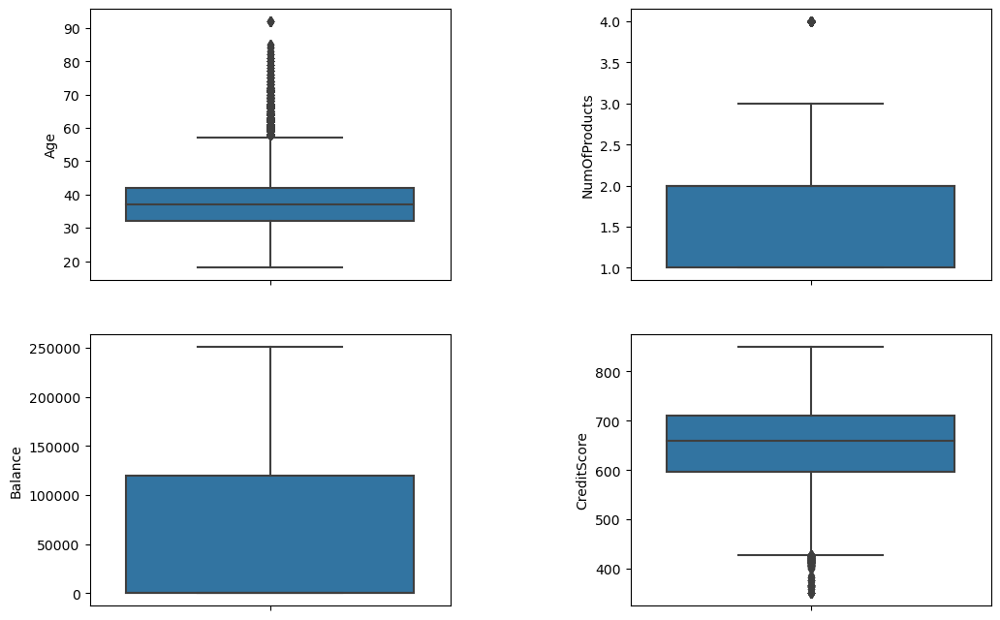

In [27]:
# age, numofproducts, balance, creditscore 이상치 그래프로 확인 
fig, ax = plt.subplots(2, 2, figsize=(12, 8))
sns.boxplot(y='Age', data=train_df, ax=ax[0, 0])
sns.boxplot(y='NumOfProducts', data=train_df, ax=ax[0, 1])
sns.boxplot(y='Balance', data=train_df, ax=ax[1, 0])
sns.boxplot(y='CreditScore', data=train_df, ax=ax[1, 1])
plt.subplots_adjust(wspace=0.5)
plt.show()

### test data

In [28]:
outlier_detector(test_df, feature_importance, print_outliners=True)

,Min,Low_Limit,Mean,Median,Up_Limit,Max,Outlier,Number of Outliers
Age,18.0,17.0,38.0,37.0,57.0,92.00,Max,4246.0
NumOfProducts,1.0,0.0,2.0,2.0,4.0,4.00,Max,304.0
IsActiveMember,0.0,-2.0,0.0,0.0,2.0,1.00,No,0.0
Balance,0.0,-180218.0,55334.0,0.0,300364.0,250898.09,No,0.0
CreditScore,350.0,428.0,657.0,660.0,880.0,850.00,Min,176.0
EstimatedSalary,12.0,-45846.0,112315.0,117832.0,274918.0,199992.48,No,0.0


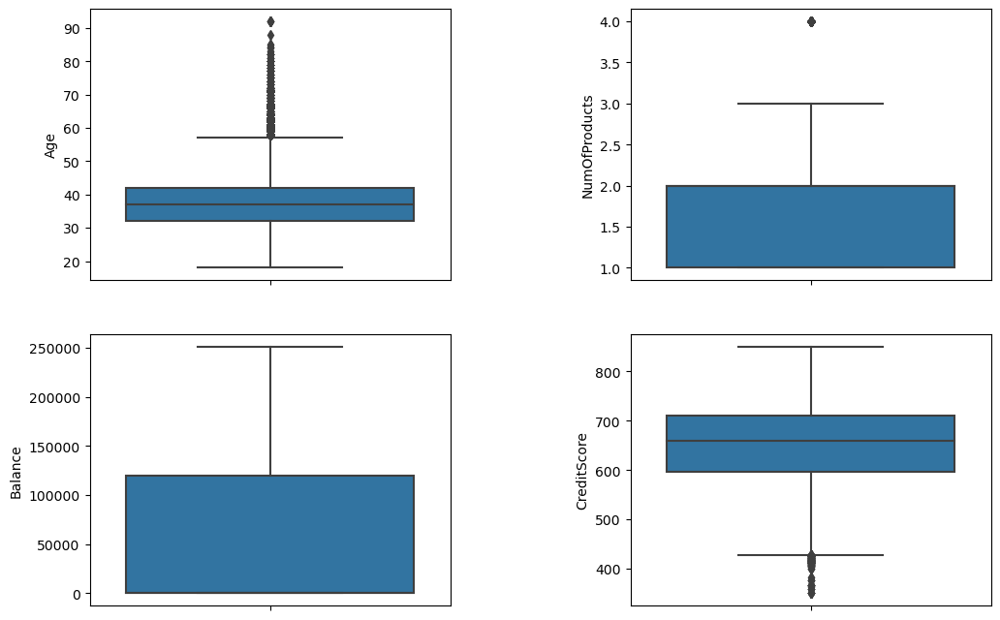

In [29]:
fig, ax = plt.subplots(2, 2, figsize=(12, 8))
sns.boxplot(y='Age', data=test_df, ax=ax[0, 0])
sns.boxplot(y='NumOfProducts', data=test_df, ax=ax[0, 1])
sns.boxplot(y='Balance', data = test_df, ax=ax[1, 0])
sns.boxplot(y='CreditScore', data = test_df, ax=ax[1, 1])
plt.subplots_adjust(wspace=0.5)
plt.show()

### origin data

In [30]:
outlier_detector(origin_df, feature_importance, print_outliners=True)

,Min,Low_Limit,Mean,Median,Up_Limit,Max,Outlier,Number of Outliers
Age,18.0,14.0,39.0,37.0,62.0,92.00,Max,359.0
NumOfProducts,1.0,0.0,2.0,1.0,4.0,4.00,Max,60.0
IsActiveMember,0.0,-2.0,1.0,1.0,2.0,1.00,No,0.0
Balance,0.0,-191472.0,76491.0,97199.0,319120.0,250898.09,No,0.0
CreditScore,350.0,383.0,651.0,652.0,919.0,850.00,Min,15.0
EstimatedSalary,12.0,-96616.0,100083.0,100185.0,296984.0,199992.48,No,0.0


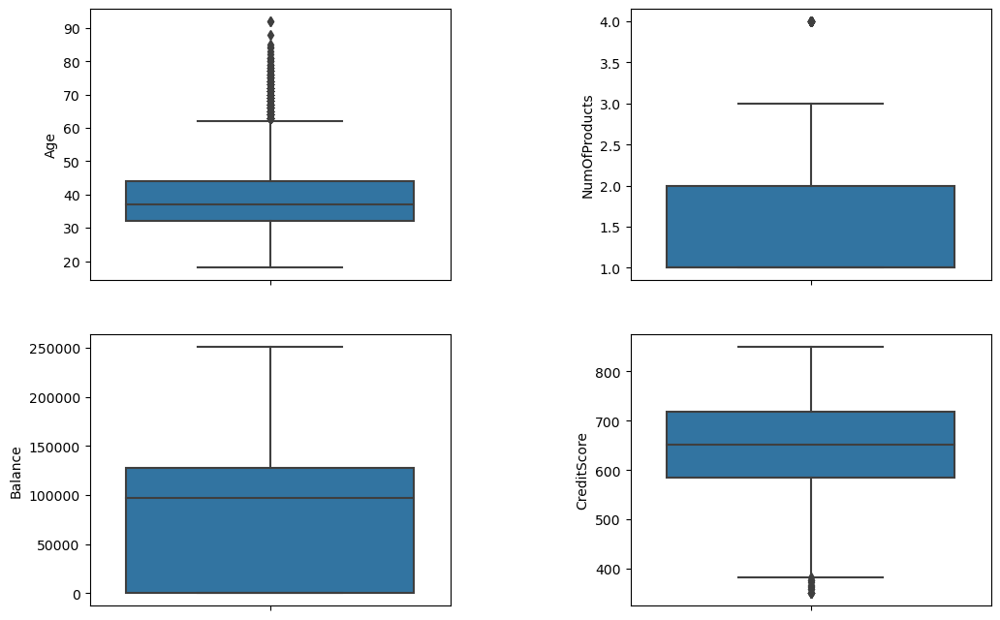

In [31]:
fig, ax = plt.subplots(2, 2, figsize=(12, 8))
sns.boxplot(y='Age', data=origin_df, ax=ax[0, 0])
sns.boxplot(y='NumOfProducts', data=origin_df, ax=ax[0, 1])
sns.boxplot(y='Balance', data=origin_df, ax=ax[1, 0])
sns.boxplot(y='CreditScore', data=origin_df, ax=ax[1, 1])
plt.subplots_adjust(wspace=0.5)
plt.show()

- 결과 : train, test, origin 데이터에 비슷한 양상의 이상치 데이터 존재 확인

### 이상치 제거

In [32]:
def remove_outlier(df, col):
    q1 = df[col].quantile(0.25)
    q3 = df[col].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - (1.5 * iqr)
    upper_bound = q3 + (1.5 * iqr)
    df = df[(df[col] > lower_bound) & (df[col] < upper_bound)]
    return df

df_age = remove_outlier(train_df, 'Age')
df_clean = remove_outlier(df_age, 'CreditScore')
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Index: 157389 entries, 0 to 165033
Data columns (total 11 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   CreditScore      157389 non-null  int64  
 1   Geography        157389 non-null  object 
 2   Gender           157389 non-null  object 
 3   Age              157389 non-null  float64
 4   Tenure           157389 non-null  int64  
 5   Balance          157389 non-null  float64
 6   NumOfProducts    157389 non-null  int64  
 7   HasCrCard        157389 non-null  float64
 8   IsActiveMember   157389 non-null  float64
 9   EstimatedSalary  157389 non-null  float64
 10  Exited           157389 non-null  int64  
dtypes: float64(5), int64(4), object(2)
memory usage: 14.4+ MB


In [57]:
len(train_df) - len(df_clean)

7615

In [33]:
df_clean_encoded = pd.get_dummies(df_clean, columns=['Geography', 'Gender'])
df_clean_encoded.head(3)

,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Geography_France,Geography_Germany,Geography_Spain,Gender_Female,Gender_Male
0,668,33.0,3,0.0,2,1.0,0.0,181449.97,0,True,False,False,False,True
1,627,33.0,1,0.0,2,1.0,1.0,49503.50,0,True,False,False,False,True
2,678,40.0,10,0.0,2,1.0,0.0,184866.69,0,True,False,False,False,True


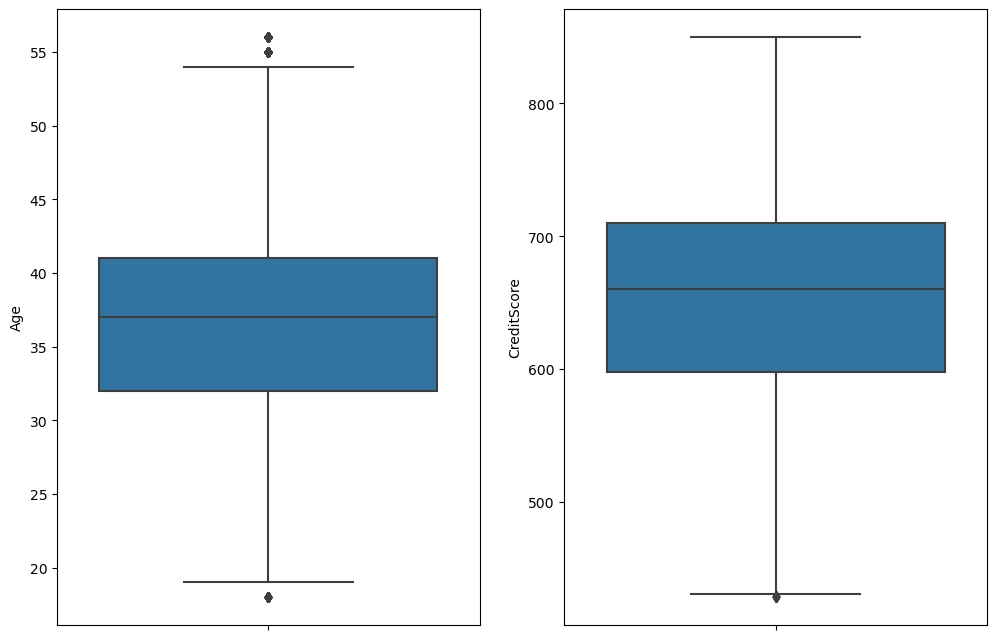

In [34]:
fig, ax = plt.subplots(1, 2,figsize=(12, 8))
sns.boxplot(y='Age', data=df_clean_encoded, ax=ax[0])
sns.boxplot(y='CreditScore', data=df_clean_encoded, ax=ax[1])
plt.show()

In [56]:
X = df_clean_encoded.drop('Exited', axis = 1)
y = df_clean_encoded['Exited']

X_train, X_test, y_train, y_test  = train_test_split(X, y, test_size = 0.2, random_state = 13)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((125911, 13), (31478, 13), (125911,), (31478,))

In [58]:
params = {
    'boosting_type': ['gbdt'],
    'n_estimators': [100, 300, 1000],
    'max_depth' : [3, 5, 7, 10],
    'learning_rate': [0.01, 0.05, 0.1],
    'num_leaves': [31, 63, 127],
    'subsample': [0.8, 0.9, 1.0],
}

lgbm = LGBMClassifier(class_weight = 'balanced', random_state = 13, verbose = 0)

lgbm_gs = GridSearchCV(estimator = lgbm, param_grid = params, cv = 3,   scoring='roc_auc')
lgbm_gs = lgbm_gs.fit(X_train, y_train, eval_set = [(X_test, y_test)], callbacks=[early_stopping(10, verbose=0)])

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

In [59]:
lgbm_gs.best_score_, lgbm_gs.best_params_

(0.8879218805452368,
 {'boosting_type': 'gbdt',
  'learning_rate': 0.01,
  'max_depth': 5,
  'n_estimators': 1000,
  'num_leaves': 63,
  'subsample': 0.8})

In [60]:
lgbm_gs = lgbm_gs.best_estimator_
lgbm_pred = lgbm_gs.predict(X_test)
lgbm_pred_proba = lgbm_gs.predict_proba(X_test)[:,1]

print_clf_eval(y_test, lgbm_pred, lgbm_pred_proba)

=> confusion matrix
[[20592  4491]
 [ 1358  5037]]
Accuracy : 0.8142, Precision : 0.5287
Recall : 0.7876, F1: 0.6327, ROC_AUC: 0.8861


In [61]:
params = {
    'n_estimators': [100, 300, 1000],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 5, 10],
    'subsample': [0.8]
}

xgb = XGBClassifier(scale_pos_weight = scale_pos_weight, random_state = 13, max_depth = 3, verbose = 0)

xgb_gs = GridSearchCV(estimator = xgb, param_grid = params, cv = 3, verbose = 0, n_jobs = -1, scoring='roc_auc')
xgb_gs.fit(X_train, y_train)

GridSearchCV(cv=3,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=3,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=13, ...),
             n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.05, 0.1],
                         'max_depth': [3, 5, 10],
                         'n_estimators': [100, 300, 1000], 'subsample': [0.8]},
             scoring='roc_auc')

In [62]:
xgb_gs.best_score_, xgb_gs.best_params_

(0.8883023432073008,
 {'learning_rate': 0.01,
  'max_depth': 5,
  'n_estimators': 1000,
  'subsample': 0.8})

In [63]:
xgb_gs = xgb_gs.best_estimator_
xgb_pred = xgb_gs.predict(X_test)
xgb_pred_proba = xgb_gs.predict_proba(X_test)[:,1]

print_clf_eval(y_test, xgb_pred, xgb_pred_proba)

=> confusion matrix
[[20793  4290]
 [ 1412  4983]]
Accuracy : 0.8189, Precision : 0.5374
Recall : 0.7792, F1: 0.6361, ROC_AUC: 0.8864


In [64]:
models = [lgbm_gs, xgb_gs]
model_names = ['LightGBM', 'XGB']

results = get_result_pd(models, model_names, X_train, y_train, X_test, y_test)
results

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

,Accuracy,Precision,Recall,F1,AUC
LightGBM,0.814188,0.528652,0.787647,0.632670,0.886082
XGB,0.818858,0.537367,0.779203,0.636074,0.886433


<div>
<style scoped>
    .dataframe tbody tr th:only-of-type {
        vertical-align: middle;
    }

    .dataframe tbody tr th {
        vertical-align: top;
    }

    .dataframe thead th {
        text-align: right;
    }
</style>
<table border="1" class="dataframe">
  <thead>
    <tr style="text-align: right;">
      <th></th>
      <th>Accuracy</th>
      <th>Precision</th>
      <th>Recall</th>
      <th>F1</th>
      <th>ROC_AUC</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <th>LogisticReg</th>
      <td>0.754159</td>
      <td>0.452582</td>
      <td>0.739892</td>
      <td>0.561625</td>
      <td>0.818693</td>
    </tr>
    <tr>
      <th>DecisionTree</th>
      <td>0.816551</td>
      <td>0.548990</td>
      <td>0.773776</td>
      <td>0.642283</td>
      <td>0.883142</td>
    </tr>
    <tr>
      <th>RandomForest</th>
      <td>0.814824</td>
      <td>0.545158</td>
      <td>0.784596</td>
      <td>0.643320</td>
      <td>0.885082</td>
    </tr>
    <tr>
      <th>LightGBM</th>
      <td>0.815703</td>
      <td>0.546267</td>
      <td>0.791714</td>
      <td>0.646478</td>
      <td>0.888351</td>
    </tr>
    <tr>
      <th>XGBoost</th>
      <td>0.814369</td>
      <td>0.543677</td>
      <td>0.795700</td>
      <td>0.645978</td>
      <td>0.888560</td>
    </tr>
  </tbody>
</table>
</div>

- 이상치 제거 후 lgbm과 xgboost의 성능이 모두 소폭 감소한 것으로 보인다

In [65]:
fi = get_feature_importance(lgbm_gs.feature_importances_, X_train)
fi

,Feature,Importance
3,Balance,5048
1,Age,4594
0,CreditScore,4535
7,EstimatedSalary,4461
4,NumOfProducts,2613
6,IsActiveMember,2190
2,Tenure,1597
9,Geography_Germany,1529
11,Gender_Female,1491
5,HasCrCard,670


<div>
<style scoped>
    .dataframe tbody tr th:only-of-type {
        vertical-align: middle;
    }

    .dataframe tbody tr th {
        vertical-align: top;
    }

    .dataframe thead th {
        text-align: right;
    }
</style>
<table border="1" class="dataframe">
  <thead>
    <tr style="text-align: right;">
      <th></th>
      <th>Feature</th>
      <th>Importance</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <th>1</th>
      <td>Age</td>
      <td>5417</td>
    </tr>
    <tr>
      <th>3</th>
      <td>Balance</td>
      <td>5287</td>
    </tr>
    <tr>
      <th>7</th>
      <td>EstimatedSalary</td>
      <td>4722</td>
    </tr>
    <tr>
      <th>0</th>
      <td>CreditScore</td>
      <td>4676</td>
    </tr>
    <tr>
      <th>4</th>
      <td>NumOfProducts</td>
      <td>2693</td>
    </tr>
    <tr>
      <th>6</th>
      <td>IsActiveMember</td>
      <td>1708</td>
    </tr>
    <tr>
      <th>11</th>
      <td>Gender_Female</td>
      <td>1504</td>
    </tr>
    <tr>
      <th>2</th>
      <td>Tenure</td>
      <td>1459</td>
    </tr>
    <tr>
      <th>9</th>
      <td>Geography_Germany</td>
      <td>1408</td>
    </tr>
    <tr>
      <th>5</th>
      <td>HasCrCard</td>
      <td>674</td>
    </tr>
    <tr>
      <th>10</th>
      <td>Geography_Spain</td>
      <td>223</td>
    </tr>
    <tr>
      <th>8</th>
      <td>Geography_France</td>
      <td>206</td>
    </tr>
    <tr>
      <th>12</th>
      <td>Gender_Male</td>
      <td>23</td>
    </tr>
  </tbody>
</table>
</div>

In [66]:
fi = get_feature_importance(xgb_gs.feature_importances_, X_train)
fi

,Feature,Importance
4,NumOfProducts,0.406019
1,Age,0.251307
6,IsActiveMember,0.110147
9,Geography_Germany,0.073473
11,Gender_Female,0.056111
3,Balance,0.042517
5,HasCrCard,0.015950
8,Geography_France,0.009725
0,CreditScore,0.009225
2,Tenure,0.008870


<div>
<style scoped>
    .dataframe tbody tr th:only-of-type {
        vertical-align: middle;
    }

    .dataframe tbody tr th {
        vertical-align: top;
    }

    .dataframe thead th {
        text-align: right;
    }
</style>
<table border="1" class="dataframe">
  <thead>
    <tr style="text-align: right;">
      <th></th>
      <th>Feature</th>
      <th>Importance</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <th>4</th>
      <td>NumOfProducts</td>
      <td>0.402654</td>
    </tr>
    <tr>
      <th>1</th>
      <td>Age</td>
      <td>0.226216</td>
    </tr>
    <tr>
      <th>6</th>
      <td>IsActiveMember</td>
      <td>0.136057</td>
    </tr>
    <tr>
      <th>9</th>
      <td>Geography_Germany</td>
      <td>0.071775</td>
    </tr>
    <tr>
      <th>11</th>
      <td>Gender_Female</td>
      <td>0.060565</td>
    </tr>
    <tr>
      <th>3</th>
      <td>Balance</td>
      <td>0.044408</td>
    </tr>
    <tr>
      <th>5</th>
      <td>HasCrCard</td>
      <td>0.017522</td>
    </tr>
    <tr>
      <th>0</th>
      <td>CreditScore</td>
      <td>0.009273</td>
    </tr>
    <tr>
      <th>7</th>
      <td>EstimatedSalary</td>
      <td>0.008589</td>
    </tr>
    <tr>
      <th>2</th>
      <td>Tenure</td>
      <td>0.008119</td>
    </tr>
    <tr>
      <th>8</th>
      <td>Geography_France</td>
      <td>0.007875</td>
    </tr>
    <tr>
      <th>10</th>
      <td>Geography_Spain</td>
      <td>0.006947</td>
    </tr>
    <tr>
      <th>12</th>
      <td>Gender_Male</td>
      <td>0.000000</td>
    </tr>
  </tbody>
</table>
</div>